# Proyecto Final

In [4]:
import re
import pandas as pd
import numpy as np
from unidecode import unidecode
import unicodedata
import nltk
import seaborn as sns
import unicodedata
from random import randint
import matplotlib
import matplotlib.pyplot as plt
import spacy
from scipy import stats
from langdetect import detect
from sklearn.model_selection import train_test_split
import pandas as pd
import cufflinks as cf
from funciones import histograms, box_plots, outliers
import warnings
warnings.filterwarnings("ignore")
from plotly.offline import plot,iplot
pd.options.plotting.backend = "plotly"
import plotly.graph_objects as go
import plotly.express as px#graficos express
cf.go_offline()
pd.set_option("display.max_columns",200)

In [5]:
#Leemos el dataframe y eliminamos los registros de 2021 pues no tenemos datos completos aún para comparar pues apenas empieza el año
df = pd.read_csv('data.csv')

In [6]:
df.shape

(174389, 19)

In [8]:
#Revisamos el tipo de dato para cada una de las variables
df.dtypes

acousticness        float64
artists              object
danceability        float64
duration_ms           int64
energy              float64
explicit              int64
id                   object
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
name                 object
popularity            int64
release_date         object
speechiness         float64
tempo               float64
valence             float64
year                  int64
dtype: object

### Etiquetado de variables

In [9]:
c = ['acousticness','danceability','duration_ms','energy','instrumentalness','liveness','loudness','speechiness','valence','tempo']
v = ['explicit','key','mode','popularity','year']
d = ['release_date']
t = ['artists','id','name']

c_new = ['c_' + name for name in c]
v_new = ['v_' + name for name in v]
d_new = ['d_' + name for name in d]
t_new = ['t_' + name for name in t]

for letter in ['c','v','d','t']:
    df.rename(columns=dict(zip(eval(letter),eval(letter+'_new'))),inplace=True)

In [10]:
df.columns

Index(['c_acousticness', 't_artists', 'c_danceability', 'c_duration_ms',
       'c_energy', 'v_explicit', 't_id', 'c_instrumentalness', 'v_key',
       'c_liveness', 'c_loudness', 'v_mode', 't_name', 'v_popularity',
       'd_release_date', 'c_speechiness', 'c_tempo', 'c_valence', 'v_year'],
      dtype='object')

### Duplicados

In [11]:
#Revisamos que no haya registros duplicados
print('Valores duplicados: '+ str(df[df.duplicated()].shape[0]))

#Estos registros son iguales en todas sus columnas por lo que procedemos a eliminarlos
df.drop_duplicates(inplace=True)
df.reset_index(drop=True,inplace=True)

#Revisamos si hay ids repetidos
print('ID duplicados: '+ str(df[df.duplicated('t_id')].shape[0]))

Valores duplicados: 2159
ID duplicados: 0


### Completitud

In [12]:
#Revisamos si tenemos valores nulos
comp = pd.DataFrame(df.isnull().sum())
comp.rename({0:'Total'},axis=1,inplace=True)
comp['Completitud'] = round((comp['Total']/df.shape[0]),2)
comp

#No tenemos valores nulos en ninguna de las variables 

,Total,Completitud
c_acousticness,0,0.0
t_artists,0,0.0
c_danceability,0,0.0
c_duration_ms,0,0.0
c_energy,0,0.0
v_explicit,0,0.0
t_id,0,0.0
c_instrumentalness,0,0.0
v_key,0,0.0
c_liveness,0,0.0


### Consistencia

In [13]:
#Vemos que todas las variables continuas tienen rangos correctos segun lo que mide cada una 
df.filter(like='c_').describe()

,c_acousticness,c_danceability,c_duration_ms,c_energy,c_instrumentalness,c_liveness,c_loudness,c_speechiness,c_tempo,c_valence
count,172230.000000,172230.000000,1.722300e+05,172230.000000,172230.000000,172230.000000,172230.000000,172230.000000,172230.000000,172230.000000
mean,0.501914,0.536246,2.326718e+05,0.480989,0.194968,0.211396,-11.777780,0.105896,116.937762,0.525249
std,0.379394,0.175858,1.471768e+05,0.272032,0.332974,0.180661,5.690105,0.183053,30.290836,0.264392
min,0.000000,0.000000,4.937000e+03,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000
25%,0.091300,0.414000,1.662000e+05,0.248000,0.000000,0.099300,-14.935750,0.035200,93.834000,0.311000
50%,0.523000,0.547000,2.057175e+05,0.463000,0.000498,0.138000,-10.867000,0.045400,115.657000,0.537000
75%,0.896000,0.668000,2.656000e+05,0.708000,0.238000,0.270000,-7.532000,0.076000,134.991000,0.744000
max,0.996000,0.988000,5.338302e+06,1.000000,1.000000,1.000000,3.855000,0.971000,243.507000,1.000000


In [14]:
#Mismo caso con las variables discretas, algunas de ellas son categoricas y los años tienen valores esperados
df.filter(like='v_').describe()

,v_explicit,v_key,v_mode,v_popularity,v_year
count,172230.000000,172230.000000,172230.000000,172230.000000,172230.000000
mean,0.067956,5.204395,0.703147,25.925913,1976.582001
std,0.251670,3.517851,0.456873,21.866745,26.708673
min,0.000000,0.000000,0.000000,0.000000,1920.000000
25%,0.000000,2.000000,0.000000,1.000000,1955.000000
50%,0.000000,5.000000,1.000000,26.000000,1977.000000
75%,0.000000,8.000000,1.000000,42.000000,1998.000000
max,1.000000,11.000000,1.000000,100.000000,2021.000000


### Variables de fecha

In [15]:
#Notamos que muchos registros únicamente tienen el dato del año
print('Porcentaje de registros que únicamente muestran el año: ' + str(round(100*df[df['d_release_date'].astype(str).str.len() ==4].shape[0]/df.shape[0],2)) + '%')

#Al ser muchos registros opte por no eliminarlos, ni intentar agregarles meses pues sesgaría la informacion si hicieramos un analisis de los meses

Porcentaje de registros que únicamente muestran el año: 29.44%


In [16]:
#Revisamos si los años en las fechas coinciden con con los de la columna v_year
df_revision = df[['d_release_date','v_year']].copy()
df_revision['year_2'] = df['d_release_date'].apply(lambda x: int(x[:4]))

df_revision[df_revision['v_year'] != df_revision['year_2']]
#En efecto coinciden todos

,d_release_date,v_year,year_2


### Variables de texto

In [17]:
#En este caso los datos son nombres por lo que no se puede hacer un analisis de consistencias
df.filter(like='t_')[:3]

,t_artists,t_id,t_name
0,['Mamie Smith'],0cS0A1fUEUd1EW3FcF8AEI,Keep A Song In Your Soul
1,"[""Screamin' Jay Hawkins""]",0hbkKFIJm7Z05H8Zl9w30f,I Put A Spell On You
2,['Mamie Smith'],11m7laMUgmOKqI3oYzuhne,Golfing Papa


In [18]:
def clean_text(text, pattern="[^a-zA-Z0-9 ]"):
    cleaned_text = unicodedata.normalize('NFD', text).encode('ascii', 'ignore')
    cleaned_text = re.sub(pattern, " ", cleaned_text.decode("utf-8"), flags=re.UNICODE)
    cleaned_text = u' '.join(cleaned_text.lower().strip().split())
    return cleaned_text

In [19]:
#Para este estudio tomaremos el primer artista como el artista principal
df['t_artists'] = df['t_artists'].apply(lambda x: x.replace('[','').replace(']','').replace('"','').replace("'",'').lower())
df['t_name'] = df['t_name'].apply(lambda x: x.lower())
df_original = df.copy()


df['t_artists'] = df['t_artists'].apply(lambda x: x.split(',')[0]) #tomamos el primer artista como el principal

## Analisis exploratorio

In [20]:
#Analisis de las variables en el mismo rango 
df_1 = df.groupby('v_year').mean()
df_1.reset_index(inplace=True)
fig = px.line(df_1, x='v_year', y=[i for i in df.filter(like='c_') if i not in ['c_duration_ms','c_tempo','c_loudness']])
fig.update_layout(autosize=False,width=800,height=500)
fig.show()
fig.write_image('fig2.png')

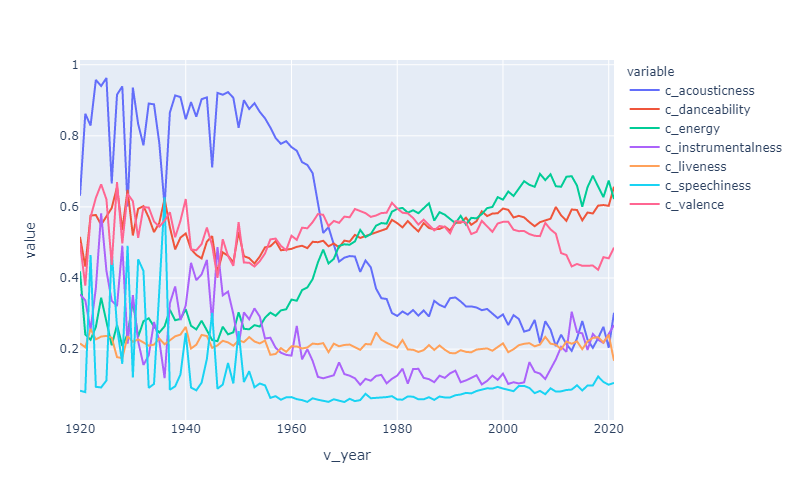

In [21]:
fig =go.Figure()
fig.add_trace(go.Scatter(x=df_1['v_year'], y=df_1['c_duration_ms'],name='c_duration_ms',showlegend=True,mode='lines'))
fig.update_layout(title='Media de duración por año',height=350)
fig.show()
fig.write_image('fig3.png')

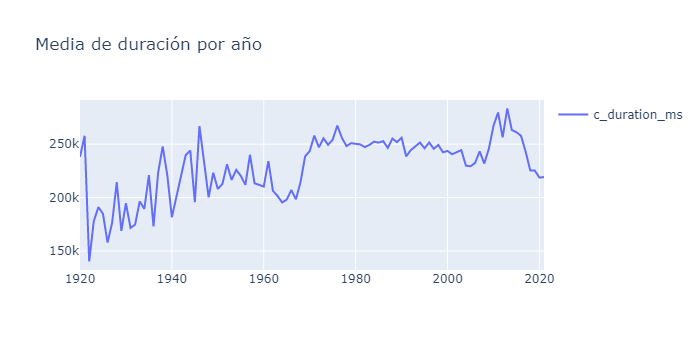

In [22]:
fig =go.Figure()
fig.add_trace(go.Scatter(x=df_1['v_year'], y=df_1['c_tempo'],name="c_tempo",showlegend=True,mode='lines'))
fig.update_layout(title='Media de tempo por año',height=350)
fig.show()
fig.write_image('fig4.png')

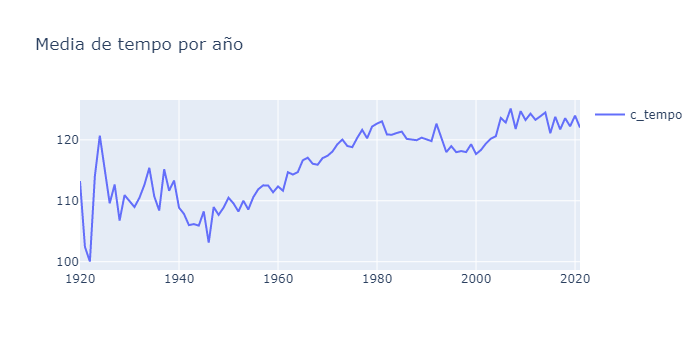

In [23]:
df_2 = df.groupby('v_year').sum()
df_2.reset_index(inplace=True)
fig =go.Figure()
fig.add_trace(go.Scatter(x=df_2['v_year'], y=df_2['v_explicit'],name="v_explicit",showlegend=True,mode='lines'))
fig.update_layout(title='Número de canciones con contenido explícito por año',height=350)
fig.show()
fig.write_image('fig5.png')

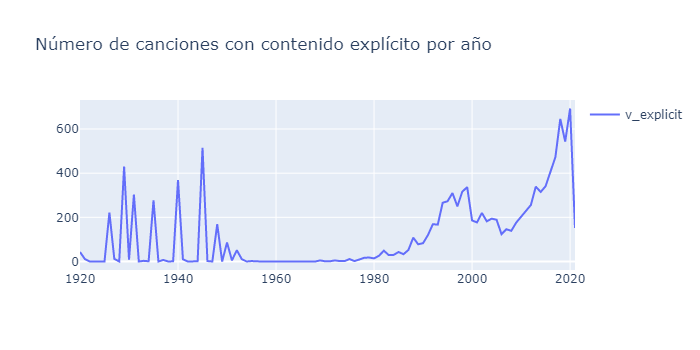

In [24]:
fig =go.Figure()
fig.add_trace(go.Scatter(x=df_1['v_year'], y=df_1['v_popularity'],name="Popularidad",showlegend=True,mode='lines'))
fig.update_layout(title='Media de popularidad por año',height=350)
fig.show()
fig.write_image('fig6.png')

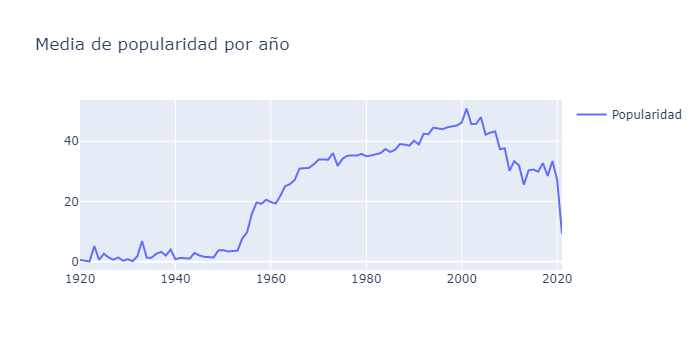

In [25]:
dict_key = dict(zip([0,1,2,3,4,5,6,7,8,9,10,11],['C','Db','D','Eb','E','F','Gb','G','Ab','A','Bb','B']))
df['t_key'] = df['v_key'].map(dict_key)

X = list(df['t_key'].value_counts(1).index)
Y = list(df['t_key'].value_counts(1).values)

layout = go.Layout()
fig = go.Figure(data=[go.Pie(labels=X, values=Y, textinfo='label+percent',
                             insidetextorientation='tangential')])

fig.update_layout(title_text="Porcentaje de canciones por nota musical",
                  title_font_size=20)
fig.update_layout(autosize=False,width=500,height=500)

fig.show()

fig.write_image("fig7.png")

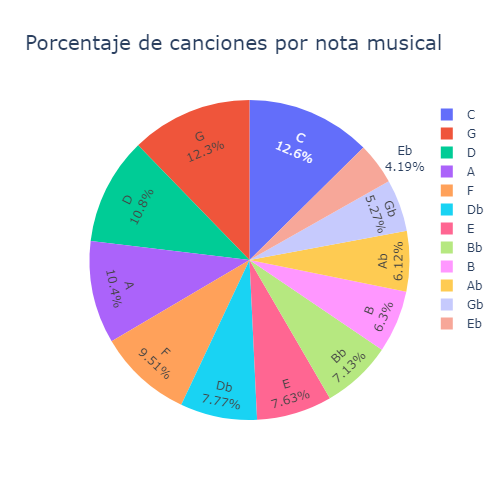

In [28]:
X = list(df['v_explicit'].value_counts(1).index)
Y = list(df['v_explicit'].value_counts(1).values)

layout = go.Layout()
fig = go.Figure(data=[go.Pie(labels=X, values=Y, textinfo='label+percent',
                             insidetextorientation='tangential')])

fig.update_layout(title_text="Porcentaje de canciones explícitas",
                  title_font_size=20)
fig.update_layout(autosize=False,width=500,height=500)

fig.show()

fig.write_image("fig9.png")

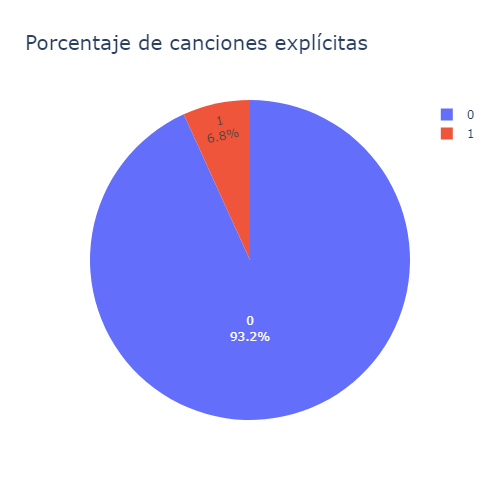

In [29]:
df_1 = df.groupby('t_artists').mean()
df_1 = df_1.sort_values('v_popularity',ascending=False)

X = list(df_1.index[:10])
Y = list(df_1['v_popularity'][:10].values)

layout = go.Layout()
fig = go.Figure(data=[go.Bar(x=X, y=Y,text=Y,textposition='auto')],layout=layout)
fig.update_layout(title_text="Artistas más populares",
                  title_font_size=20)
fig.update_layout(autosize=False,width=500,height=500)

fig.update_layout( plot_bgcolor='rgb(242,242,242)',
   paper_bgcolor= "rgba(0,0,0,0)")
fig.update_traces(texttemplate='%{text:s}', textposition='outside') #Numeros dentro de las barras
fig.update_yaxes(showgrid=True, zeroline=False, gridcolor='white')
fig.update_xaxes(showgrid=False, gridwidth=1, gridcolor='LightPink')
fig.show()

fig.write_image("fig10.png")

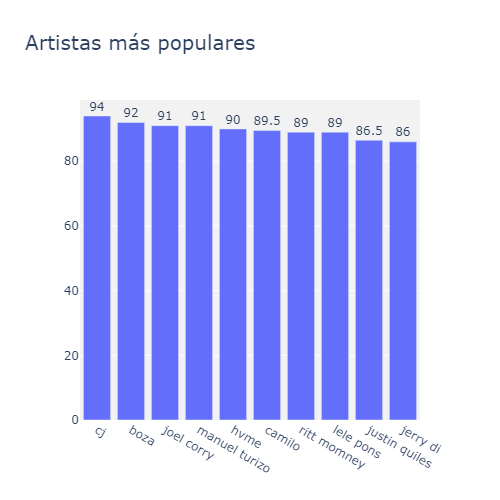

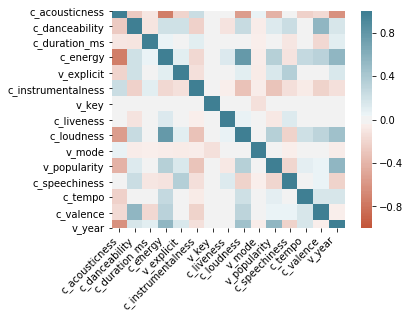

In [32]:
corr = df.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

In [33]:
corr = df.corr()
#OverallQual: Material general y calidad de acabado
#c_GrLivArea: pies cuadrados del área habitable sobre el nivel (suelo)
#ExterQual: Calidad del material exterior
corr[['v_popularity']].sort_values(by = 'v_popularity',ascending = False).style.background_gradient()

,v_popularity
v_popularity,1
v_year,0.540481
c_loudness,0.345262
c_energy,0.339694
v_explicit,0.155708
c_danceability,0.129071
c_tempo,0.0981441
c_valence,0.0610122
c_duration_ms,0.0267159
v_mode,0.00574511


## MISSINGS

In [41]:
#Verificamos que solo tenemos missings en la variable v_month
df.isnull().sum()

c_acousticness            0
t_artists                 0
c_danceability            0
c_duration_ms             0
c_energy                  0
v_explicit                0
t_id                      0
c_instrumentalness        0
v_key                     0
c_liveness                0
c_loudness                0
v_mode                    0
t_name                    0
v_popularity              0
d_release_date            0
c_speechiness             0
c_tempo                   0
c_valence                 0
v_year                    0
t_artists_token           0
v_num_artists             0
t_key                     0
v_key_b                   0
v_month               50699
dtype: int64

In [42]:
from scipy.stats import chisquare
moda = df['v_month'].mode()[0]

#Prueba Ji para verificar que no se modifico la distribucion

x_i = df['v_month'].fillna(moda).value_counts()
k = x_i.sum()
p_i = df['v_month'].dropna().value_counts(1)
m_i = k*p_i
chi = chisquare(f_obs=x_i,f_exp=m_i)
p_val = chi.pvalue
alpha=0.05
if p_val<alpha:
    print("Rechazamos HO")
else:
    print("Aceptamos HO")
    
#La imputacion resulto en una distribucion distinta por lo que no es posible hacerlo

Rechazamos HO


## Reducción de dimensiones

### Valor perdido

In [64]:
#Vemos que no tenemos valores nulos en nuestra tabla por lo que esta opción queda descartada.
comp = pd.DataFrame(df.isnull().sum())
comp.rename({0:'Total'},axis=1,inplace=True)
comp['Completitud'] = round((comp['Total']/df.shape[0]),2)
comp

,Total,Completitud
c_acousticness,0,0.0
t_artists,0,0.0
c_danceability,0,0.0
c_duration_ms,0,0.0
c_energy,0,0.0
v_explicit,0,0.0
t_id,0,0.0
c_instrumentalness,0,0.0
v_key,0,0.0
c_liveness,0,0.0


### Filtro de varianza

In [65]:
#Por la varianza tampoco podemos hacer reducción puesto que todas tienen variazas reelevantes y acordes a los rangos de valores
#Que las variables toman
df.filter(like="c_").describe(percentiles=np.arange(0.1,1.1,.1))

,c_acousticness,c_danceability,c_duration_ms,c_energy,c_instrumentalness,c_liveness,c_loudness,c_speechiness,c_tempo,c_valence
count,157481.000000,157481.000000,157481.000000,157481.000000,157481.000000,157481.000000,157481.000000,157481.000000,157481.000000,157481.000000
mean,0.492561,0.547020,210736.109194,0.491474,0.170848,0.210371,48.698219,0.107334,116.684225,0.541511
std,0.376478,0.170087,71004.945860,0.266549,0.315556,0.176450,5.065649,0.185175,29.059282,0.258145
min,0.000000,0.058900,17187.000000,0.000241,0.000000,0.009670,34.257000,0.022300,32.800000,0.000000
10%,0.005930,0.312000,128840.000000,0.146000,0.000000,0.073600,41.403000,0.030000,80.007000,0.174000
20%,0.047200,0.397000,154893.000000,0.224000,0.000000,0.092300,44.445000,0.033200,89.952000,0.286000
30%,0.146000,0.459000,172693.000000,0.301000,0.000002,0.106000,46.456000,0.036500,98.053000,0.381000
40%,0.304000,0.510000,187240.000000,0.386000,0.000027,0.119000,47.983000,0.040300,107.014000,0.473000
50%,0.501000,0.557000,201373.000000,0.474000,0.000262,0.140000,49.368000,0.045400,115.609000,0.554000
60%,0.687000,0.604000,219027.000000,0.564000,0.002750,0.174000,50.682000,0.052900,123.310000,0.635000


### Alta correlación entre variables

In [66]:
df[[x for x in df if x!="v_popularity"]].corr(method="spearman").iplot(kind="heatmap",colorscale="orrd",title="Matriz de Correlación")

In [67]:
#Analizando la correlación entre las variables vemos en no hay muchas que tienen una correlación muy grande con otras variables
#las únicas que cuentan con una relación muy alta es loudness y energy, sin embargo estas variables tienen escalas distintas
#y están muy cerca de una correlación de .80 por no eliminaré ninguna de momento.
corr=df[[x for x in df if x!="v_popularity"]].corr(method="spearman")
corr=abs(corr)
corr[['c_loudness']][corr[['c_loudness']]>.8].dropna()

,c_loudness
c_loudness,1.0


### Correlación con la variable objetivo

In [68]:
#Vemos que para el método de spearman las variables como key, valence y mode no tienen una alta correlación con la variable
#de hecho esto ya se había visto anteriormente con la variable key
corr=df.corr(method = 'spearman')
corr=abs(corr)
corr_spear = corr[['v_popularity']].sort_values(by = 'v_popularity',ascending = False)
corr_spear[corr_spear < .1].dropna()

,v_popularity
c_tempo,0.097168
v_key_b,0.040297
c_valence,0.032543
v_mode,0.009550
v_key,0.002235


In [69]:
#Eliminaremos estas variables puesto que para un modelo de predicción no aportarán mucha información
corr_spear = corr_spear[corr_spear < .1].dropna()
df.drop(corr_spear.index.tolist(), axis=1, inplace=True)

### Multicolinealidad

In [70]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

In [71]:
#Para el analisis de multicolinealidad tomamos las variables numericas, las convertimos en float y aplicamos el algoritmo
#En primera instancia obtuvimos que loudness y year tienen un VIF muy grande por lo que vamos a eliminar estas variables y ver como se comporta
df_2 = df[['c_acousticness', 'c_danceability', 'c_duration_ms', 'v_explicit','c_loudness', 'v_year','c_energy' ,'c_instrumentalness', 'c_liveness', 'v_popularity','c_speechiness', 'v_num_artists']].copy()

for col in df_2.columns:
    df_2[col]=df_2[col].astype(float)
    
numeric = df_2[[x for x in df_2 if x != 'v_popularity']]

for col in df_2.columns:
    df_2[col]=df_2[col].astype(float)
    
vif = calc_vif(numeric)

vif.sort_values('VIF', ascending = False)

,variables,VIF
4,c_loudness,301.405884
5,v_year,255.657215
6,c_energy,19.553390
1,c_danceability,13.747831
2,c_duration_ms,11.012650
0,c_acousticness,6.972231
10,v_num_artists,3.408568
8,c_liveness,2.654553
9,c_speechiness,1.977906
7,c_instrumentalness,1.515757


In [72]:
#Ya tenemos valores mas pequeños por lo que podemos trabajar con ellos, eliminamos del dataframe estas dos variables
df_2 = df[['c_acousticness', 'c_danceability', 'c_duration_ms', 'v_explicit','c_energy' ,'c_instrumentalness', 'c_liveness', 'v_popularity','c_speechiness', 'v_num_artists']].copy()

for col in df_2.columns:
    df_2[col]=df_2[col].astype(float)
    
numeric = df_2[[x for x in df_2 if x != 'v_popularity']]

for col in df_2.columns:
    df_2[col]=df_2[col].astype(float)
    
vif = calc_vif(numeric)

vif.sort_values('VIF', ascending = False)

,variables,VIF
1,c_danceability,9.845822
2,c_duration_ms,7.922666
4,c_energy,7.161884
0,c_acousticness,3.901191
8,v_num_artists,3.275371
6,c_liveness,2.610350
7,c_speechiness,1.764233
5,c_instrumentalness,1.381795
3,v_explicit,1.322046


In [73]:
df.drop(['v_year','c_loudness'], axis = 1, inplace = True)

In [74]:
df.drop(['t_artists','t_id','t_name','d_release_date','t_artists_token','t_key'],axis=1).to_csv('data_fit.csv',index=False)

### PCA

In [66]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [67]:
#Finalmente haremos un análisis de componentes principales
df.reset_index(drop=True, inplace=True)
df_2 = df[['c_acousticness', 'c_danceability', 'c_duration_ms','c_energy', 'v_explicit', 'c_instrumentalness', 'c_liveness', 'v_popularity', 'c_speechiness', 'v_num_artists']].copy()

#Dividimos los dataframes
X_train,X_test = train_test_split(df_2,test_size=.2,random_state=45)

#Separamos la variable objetivo
df_train = X_train[[x for x in X_train if x != 'v_popularity']]
df_test = X_train[[x for x in X_train if x != 'v_popularity']]
y_train = X_train[['v_popularity']]
y_test = X_test[["v_popularity"]]

#Normalizamos las variables
scaler = StandardScaler()
scaler.fit(df_train)
df_train_sc = pd.DataFrame(scaler.transform(df_train))
df_test_sc = pd.DataFrame(scaler.transform(df_train))

In [68]:
pca = PCA(n_components = 9)
pca.fit(df_train_sc)

PCA(copy=True, iterated_power='auto', n_components=9, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [69]:
X_train_pca = pd.DataFrame(pca.transform(df_train_sc))
X_test_pca = pd.DataFrame(pca.transform(df_test_sc))

In [70]:
X_train_pca.head()

,0,1,2,3,4,5,6,7,8
0,1.216330,0.293383,3.003117,0.189069,1.521587,-0.492175,-1.040143,-0.885380,0.519886
1,-0.431197,0.014064,0.230030,-0.866715,0.466271,0.146974,-0.212573,-0.326717,0.075176
2,-1.515784,-0.722098,-0.874456,0.026813,0.275885,0.486821,-0.032187,0.232920,-0.374386
3,2.596471,0.270106,-0.235308,0.173508,-1.419144,1.309898,-0.141005,-0.204011,-0.151868
4,2.528153,-0.444583,-0.618110,0.319270,-1.716518,-0.662467,-0.301067,-0.050085,0.145638


In [71]:
pca.explained_variance_ratio_

array([0.24486823, 0.17646249, 0.12479802, 0.10907514, 0.09611239,
       0.08712224, 0.07707223, 0.05993851, 0.02455074])

In [72]:
var_acum = [sum(pca.explained_variance_ratio_[0:i]) for i in range(1,10)]

In [73]:
#La varianza llega a .83 con 6 variables
var_acum

[0.24486823399997376,
 0.4213307226881126,
 0.5461287416987514,
 0.6552038824527693,
 0.75131627694352,
 0.8384385217408316,
 0.9155107551247061,
 0.9754492609281671,
 0.9999999999999999]

In [77]:
pca = PCA(n_components = 2)
dimention_2 = pca.fit_transform(df_train_sc)
total_var = pca.explained_variance_ratio_.sum() * 100
fig = px.scatter(dimention_2, x=0, y=1,title=f'Total de Varianza Explicada: {total_var:.2f}%',
                 labels={'0': 'Componente Principal 1', '1': 'Componente Principal 2'})
fig.show()

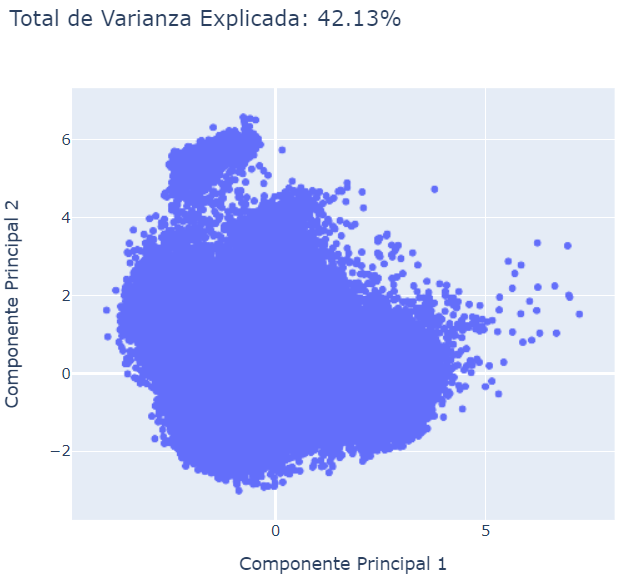